In [2]:
import matplotlib
import matplotlib.pyplot as plt
import os
import pandas as pd
import scipy.stats as ss
import numpy as np
import seaborn as sns
from matplotlib.patches import Rectangle, Patch
from matplotlib.collections import PatchCollection
import re
import matplotlib.patches as patches
from matplotlib.colors import LinearSegmentedColormap
from collections import Counter

In [3]:
fname_prefix = "zmat_multimodal_h2z196_elbow_orig_040522"
n_pheno = 583
n_t1, n_rsfmri, n_diffusion = 171, 139, 273
n_snps = 9061586
data = np.memmap(f"{fname_prefix}.dat", dtype='f4', mode='r', shape=(n_pheno, n_snps))

t1_traits = pd.read_csv("zmat_discovery_T1_orig_140522.rows", header=None, names=["TRAIT"]).squeeze()
rsfmri_traits = pd.read_csv("zmat_discovery_rsfmri_orig_140522.rows", header=None, names=["TRAIT"]).squeeze()
diffusion_traits = pd.read_csv("zmat_discovery_diffusion_orig_140522.rows", header=None, names=["TRAIT"]).squeeze()
multimodal_traits = pd.read_csv("zmat_h2z196_elbow_orig_040522.rows", header=None, names=["TRAIT"]).squeeze()
snps = pd.read_csv("zmat_h2z196_elbow_orig_040522.cols", header=None, names=["SNP"]).squeeze()

assert n_snps == snps.shape[0]
assert n_pheno == (t1_traits.shape[0] + rsfmri_traits.shape[0] + diffusion_traits.shape[0])

In [4]:
data.shape, snps.shape, t1_traits.shape, rsfmri_traits.shape, diffusion_traits.shape

((583, 9061586), (9061586,), (171,), (139,), (273,))

In [5]:
multimodal_traits_idx = pd.Series(multimodal_traits.index.values, index=multimodal_traits)
all_traits = pd.concat([t1_traits, rsfmri_traits, diffusion_traits])
multimodal_traits_idx_ordered = multimodal_traits_idx[all_traits]
multimodal_traits_idx_ordered

TRAIT
univ_QCed_norm_orig.Left_Lateral_Ventricle.glm.linear          24
univ_QCed_norm_orig.lh_precuneus_thickness.glm.linear         225
univ_QCed_norm_orig.rh_isthmuscingulate_area.glm.linear       262
univ_QCed_norm_orig.rh_inferiorparietal_area.glm.linear       256
univ_QCed_norm_orig.rh_medialorbitofrontal_area.glm.linear    270
                                                             ... 
univ_QCed_orig.NF_PCs80.glm.linear                            574
univ_QCed_orig.N0_PCs37.glm.linear                            340
univ_QCed_orig.NF_PCs28.glm.linear                            518
univ_QCed_orig.NF_PCs32.glm.linear                            523
univ_QCed_orig.ND_PCs109.glm.linear                           386
Length: 583, dtype: int64

In [6]:
fname_lead = "/cluster/projects/p33/users/elizabept/multimodal/discovery/sensitivity/results/multimodal/multimodal_mostest_eig16_0.6_250_1.67.most.orig.clump.lead.csv"
lead = pd.read_table(fname_lead)
lead = lead.loc[lead.is_locus_lead,:]
lead.sort_values(by="PVAL",inplace=True)
print(lead.shape)

(794, 8)


In [7]:
lead.head()

,locusnum,CHR,LEAD_SNP,LEAD_BP,MinBP,MaxBP,PVAL,is_locus_lead
31,21,1,rs6658111,47980916,47668936,48001930,4.940656e-324,True
1072,629,15,rs8025239,39623588,39534404,39664000,4.940656e-324,True
1154,680,16,rs4843558,87225473,87201728,87373871,2.341990e-241,True
1035,613,14,rs74826997,59628609,59449138,60033892,1.281750e-218,True
964,568,12,rs12146713,106476805,106365661,106510902,2.266830e-193,True


In [8]:
snps.head()

0    rs533090414
1     rs28619159
2    rs539032812
3     rs12238997
4    rs200531508
Name: SNP, dtype: object

In [12]:
snps_idx = pd.Series(snps.index.values, index=snps)
lead_idx = snps_idx[lead.LEAD_SNP]

In [13]:
data_arr = np.array(data)
data_arr = data_arr[multimodal_traits_idx_ordered.values]

In [14]:
data_arr.T.shape, multimodal_traits_idx_ordered.shape

((9061586, 583), (583,))

In [15]:
data_lead = data_arr.T[lead_idx.values]
lead_snp = lead.LEAD_SNP.values

In [9]:
# Get lists of SNPs for each sector of the multimodal venn diagram
path = "/cluster/projects/p33/users/elizabept/multimodal/discovery/sensitivity/results"
crossmodality_snps = pd.read_table(f"{path}/2modalities_loci_Bonf3.txt",sep='\t')
multimodal_snps = pd.read_table(f"{path}/boostmultimodal_loci_Bonf3.txt",sep='\t')
t1_snps = pd.read_table(f"{path}/T1_specific_loci_Bonf3.txt",sep='\t')
rsfmri_snps = pd.read_table(f"{path}/rsfmri_specific_loci_Bonf3.txt",sep='\t')
diffusion_snps = pd.read_table(f"{path}/diffusion_specific_loci_Bonf3.txt",sep='\t')

In [10]:
diffusion_snps

,CHR,MinBP,MaxBP,locusnum,LEADSNP
0,1,38397341,38463504,9,rs4072980
1,1,61774969,61839973,17,rs2806441
2,1,64617327,64658060,19,rs11208378
3,1,65188498,65347041,20,rs2780818
4,1,89098380,89442733,22,rs1085563
...,...,...,...,...,...
172,21,40012667,40074905,500,rs458465
173,22,18281729,18331871,501,rs750559
174,22,19749525,19768337,502,rs41298840
175,22,37445668,37470604,508,rs855791


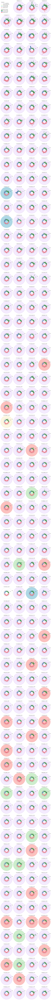

In [27]:
sns.set_style('white')
savefig = False
nrows, ncols = 70, 4
formats = ["png", "svg"]
outf = f"/tsd/p33/home/p33-alexeas/circular_manhattan.multimodal.230623"

fig, axs = plt.subplots(nrows, ncols, figsize=(10,2.8*nrows), subplot_kw={'projection':"polar"},
                        constrained_layout=True) # constrained_layout=True
#'#4477AA', '#EE6677', '#228833', '#CCBB44', '#66CCEE', '#AA3377', '#BBBBBB'.
cluster_names = ["structural MRI", "functional MRI", "diffusion MRI"]
cluster_sizes = [n_t1, n_rsfmri, n_diffusion]
cluster_colors = ['#228833', '#4477AA', '#EE6677']
#cluster_colors = ['#BBBBBB', '#BBBBBB', '#BBBBBB']
modality_label = [">= 2 modalities", "Multimodal boost", "structural MRI", "functional MRI", "diffusion MRI"]
modality_facecolor = ["#f5ebff", "#fdf7e1", "#cdeecc", "#add8e6", "#fdc0be"]
modality_snps = [crossmodality_snps, multimodal_snps, t1_snps, rsfmri_snps, diffusion_snps]

colors = []
for n, c in zip(cluster_sizes, cluster_colors):
    colors += [c]*n
colors = np.array(colors)

offset = 8
normal_size = 8
gws_size = 4*normal_size
z_mat = data_lead
log10pval = np.abs(z_mat) # -np.log10(ss.norm.cdf(-np.abs(z_mat)))
theta, theta_step = np.linspace(0, 2*np.pi, log10pval.shape[1], retstep=True, endpoint=False)

i_snp = 0
for i in range(nrows):
    for j in range(ncols):
        ax = axs[i][j]
        if i > 0 or j > 0: # True
            r = log10pval[i_snp]
            i_positive = z_mat[i_snp] > 0
            for i_cluster, cluster_size in enumerate(cluster_sizes):
                start_i = sum(cluster_sizes[:i_cluster])
                end_i = start_i + cluster_size
                x = theta[start_i:end_i]
                x = [x[0] - theta_step/2] + list(x) + [x[-1] + theta_step/2]
                y = [offset] + list(r[start_i:end_i] + offset) + [offset]
                # Add shading
                ax.fill_between(x, y, offset, alpha=0.8, color=cluster_colors[i_cluster])
            # Add connecting lines
            sig_threshold = -ss.norm.ppf(0.5*5E-8) # -np.log10(5E-8)
            _ = ax.plot(np.linspace(0, 2 * np.pi, 360), [sig_threshold + offset]*360, color="k", ls="--", lw=1.2)
            size = np.array([normal_size if rr < sig_threshold else gws_size for rr in r])
            # Genome-wide p-values have black outline and larger size
            #edgecolors = [c if s == normal_size else 'k' for c, s in zip(colors,size)]
            colors_direction = [c if i_positive[k] else 'w' for k,c in enumerate(colors)]
            colors_no_direction = [c for k,c in enumerate(colors)]
            edgecolors = np.array([c for c, s in zip(colors,size)])
            c = ax.scatter(theta, r + offset, c=colors_direction, s=size, marker='o', edgecolors=edgecolors)
            rs = lead.LEAD_SNP.values[i_snp]
            ax.text(0.5, 1.03, f"{rs} ({i_snp+1})", ha='center', va='center', transform = ax.transAxes, size=10)
            i_snp += 1

            y = np.arange(0,30,10)
            ax.set_yticks(y + offset)
            ax.set_yticklabels(list(map(str,y)))
            ax.set_ylim((0,30))
            ax.spines['polar'].set_visible(False)
            ax.grid(False, axis='x')
            ax.tick_params(labelleft=True, labelright=False, labeltop=False, labelbottom=False, labelsize=10)
            rs_chr, rs_bp = lead.CHR.values[i_snp], lead.LEAD_BP.values[i_snp]
            for face_color, mod_snps in zip(modality_facecolor, modality_snps):
                if ((mod_snps.CHR==rs_chr) & (mod_snps.MinBP<=rs_bp) & (mod_snps.MaxBP>=rs_bp)).any():
                    ax.set_facecolor(face_color)
                    break

legends1_handles = []
for name, color, size in zip(cluster_names, cluster_colors, cluster_sizes):
    patch = Patch(color=color, label=name)
    legends1_handles.append(patch)

legends2_handles = []
for color, name in zip(modality_facecolor, modality_label):
    patch = Patch(color=color, label=name)
    legends2_handles.append(patch)

            
# add legend to the first axis
if True:
    ax = axs[0][0]
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['polar'].set_visible(False)
    legend1 = ax.legend(loc='lower left', handles=legends1_handles, fontsize=10, frameon=False,
             title="Univariate z-scores", title_fontsize=10, alignment='left')
    
    ax.legend(loc='upper left', handles=legends2_handles, fontsize=10, frameon=False,
             title="Category", title_fontsize=10, alignment='left')
    ax.add_artist(legend1)
else: # add figure legend
    fig.legend(loc='upper center', handles=legends_handles, fontsize=12, frameon=False,
                  title="Phenotype clusters",title_fontsize=12, ncol=5, bbox_to_anchor=(0.5, 1.03)) # bbox_to_anchor=(0.5, -0.10)
            
#plt.tight_layout()
if savefig:
    for ext in formats:
        plt.savefig(f"{outf}.{ext}", facecolor='w')
plt.show()

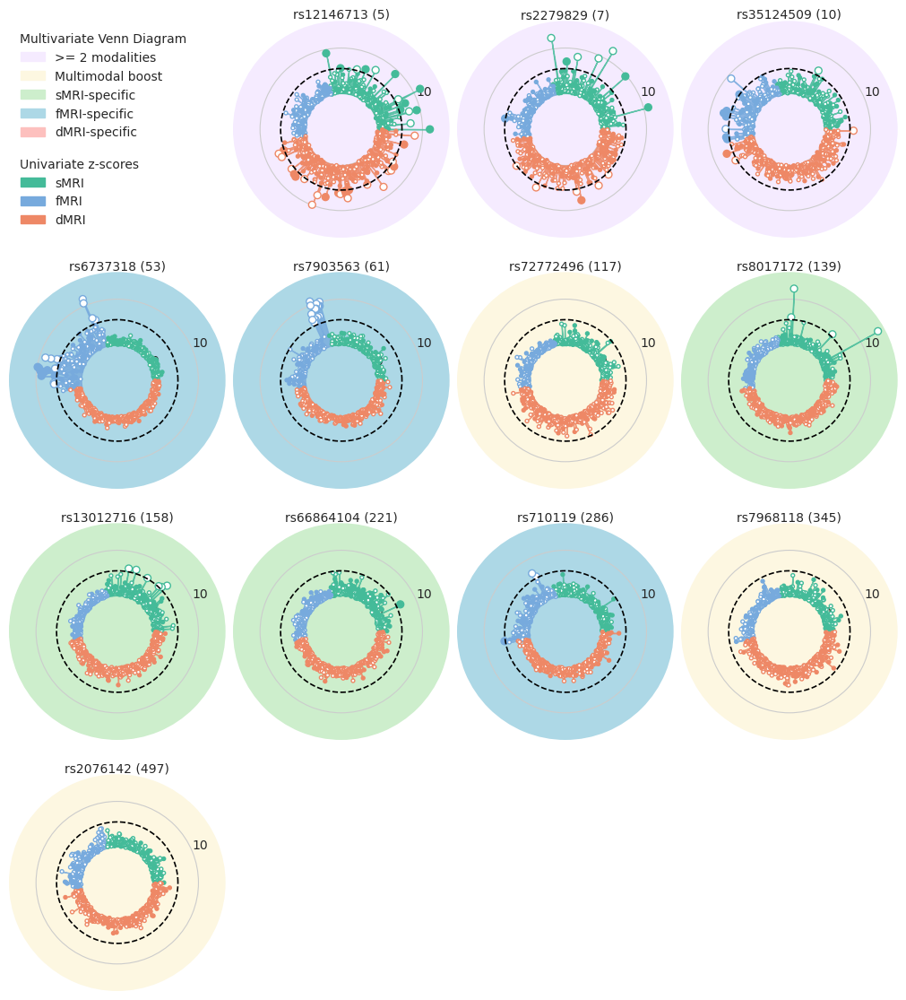

{'>= 2 modalities': 3, 'Multimodal boost': 3, 'sMRI-specific': 3, 'fMRI-specific': 3, 'dMRI-specific': 3}


In [28]:
sns.set_style('white')
savefig = True

selected_snps = "rs72772496 rs7968118 rs2076142 rs35124509 rs12146713 rs2279829 rs6737318 rs7903563 rs710119 rs13012716 rs8017172 rs66864104 rs2699315 rs4428180".split()

ncols = 4
n_snps_per_modality = 3
n_modalities = 4
nrows = (n_snps_per_modality*n_modalities + 1)//ncols + 1 + (-1 if (n_snps_per_modality*n_modalities+1)==ncols else 0)
formats = ["png", "svg"]
outf = f"/tsd/p33/home/p33-alexeas/circular_manhattan.multimodal.selected_snps.250723.light"

fig, axs = plt.subplots(nrows, ncols, figsize=(10,2.8*nrows), subplot_kw={'projection':"polar"},
                        constrained_layout=True) # constrained_layout=True
#'#4477AA', '#EE6677', '#228833', '#CCBB44', '#66CCEE', '#AA3377', '#BBBBBB'.
cluster_names = ["sMRI", "fMRI", "dMRI"]
cluster_sizes = [n_t1, n_rsfmri, n_diffusion]
# Colours: '#BBCCEE', '#CCEEFF', '#CCDDAA', '#EEEEBB', '#FFCCCC', '#DDDDDD'.
#cluster_colors = ['#228833', '#4477AA', '#EE6677'] # brignt
#cluster_colors = ['#CCDDAA', '#BBCCEE', '#FFCCCC'] # pale
cluster_colors = ['#44BB99', '#77AADD', '#EE8866'] # light
#cluster_colors = ['#555555', '#BBBBBB', '#DDDDDD'] # grey1
#cluster_colors = ['#9EA4AA', '#72787F', '#454C53'] # grey2
modality_label = [">= 2 modalities", "Multimodal boost", "sMRI-specific", "fMRI-specific", "dMRI-specific"]
modality_count = dict.fromkeys(modality_label, 0)
for label in ["dMRI-specific"]:
    modality_count[label] = n_snps_per_modality
#assert n_modalities == len(modality_label)
modality_facecolor = ["#f5ebff", "#fdf7e1", "#cdeecc", "#add8e6", "#fdc0be"]

modality_snps = [crossmodality_snps, multimodal_snps, t1_snps, rsfmri_snps, diffusion_snps]

colors = []
for n, c in zip(cluster_sizes, cluster_colors):
    colors += [c]*n
colors = np.array(colors)

offset = 8
normal_size = 8
gws_size = 4*normal_size
z_mat = data_lead
log10pval = np.abs(z_mat) # -np.log10(ss.norm.cdf(-np.abs(z_mat)))
theta, theta_step = np.linspace(0, 2*np.pi, log10pval.shape[1], retstep=True, endpoint=False)

i_axis, i_snp = 1, 0
for i_snp in range(lead.shape[0]):
    i = i_axis//ncols
    j = i_axis%ncols
    ax = axs[i][j]
    if i > 0 or j > 0: # True
        rs = lead.LEAD_SNP.values[i_snp]
        rs_chr, rs_bp = lead.CHR.values[i_snp], lead.LEAD_BP.values[i_snp]
        not_found = True
        for label, face_color, mod_snps in zip(modality_label, modality_facecolor, modality_snps):
            if ((mod_snps.CHR==rs_chr) & (mod_snps.MinBP<=rs_bp) & (mod_snps.MaxBP>=rs_bp)).any() and ((not selected_snps) or (rs in selected_snps)):
                modality_count[label] += 1
                not_found = False
                break
        if (modality_count[label] > n_snps_per_modality) or not_found:
            i_snp += 1
            continue
        else:
            i_axis += 1
            ax.set_facecolor(face_color)
            r = log10pval[i_snp]
            i_positive = z_mat[i_snp] > 0
            for i_cluster, cluster_size in enumerate(cluster_sizes):
                start_i = sum(cluster_sizes[:i_cluster])
                end_i = start_i + cluster_size
                x = theta[start_i:end_i]
                x = [x[0] - theta_step/2] + list(x) + [x[-1] + theta_step/2]
                y = [offset] + list(r[start_i:end_i] + offset) + [offset]
                # Add shading
                ax.fill_between(x, y, offset, alpha=0.8, color=cluster_colors[i_cluster])
            # Add connecting lines
            sig_threshold = -ss.norm.ppf(0.5*5E-8) # -np.log10(5E-8)
            _ = ax.plot(np.linspace(0, 2 * np.pi, 360), [sig_threshold + offset]*360, color="k", ls="--", lw=1.2)
            size = np.array([normal_size if rr < sig_threshold else gws_size for rr in r])
            # Genome-wide p-values have black outline and larger size
            #edgecolors = [c if s == normal_size else 'k' for c, s in zip(colors,size)]
            colors_direction = [c if i_positive[k] else 'w' for k,c in enumerate(colors)]
            colors_no_direction = [c for k,c in enumerate(colors)]
            edgecolors = np.array([c for c, s in zip(colors,size)])
            c = ax.scatter(theta, r + offset, c=colors_direction, s=size, marker='o', edgecolors=edgecolors)
            ax.text(0.5, 1.03, f"{rs} ({i_snp+1})", ha='center', va='center', transform = ax.transAxes, size=10)
            i_snp += 1

            y = np.arange(0,30,10)
            ax.set_yticks(y + offset)
            ax.set_yticklabels(list(map(str,y)))
            ax.set_ylim((0,24))
            ax.spines['polar'].set_visible(False)
            ax.grid(False, axis='x')
            ax.tick_params(labelleft=True, labelright=False, labeltop=False, labelbottom=False, labelsize=10)

for ia in range(i_axis, nrows*ncols):
    i = ia//ncols
    j = ia%ncols
    axs[i][j].axis("off")
            
legends1_handles = []
for name, color, size in zip(cluster_names, cluster_colors, cluster_sizes):
    patch = Patch(color=color, label=name)
    legends1_handles.append(patch)

legends2_handles = []
for color, name in zip(modality_facecolor, modality_label):
    patch = Patch(color=color, label=name)
    legends2_handles.append(patch)

            
# add legend to the first axis
if True:
    ax = axs[0][0]
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['polar'].set_visible(False)
    legend1 = ax.legend(loc='lower left', handles=legends1_handles, fontsize=10, frameon=False,
             title="Univariate z-scores", title_fontsize=10, alignment='left')
    
    ax.legend(loc='upper left', handles=legends2_handles, fontsize=10, frameon=False,
             title="Multivariate Venn Diagram", title_fontsize=10, alignment='left')
    ax.add_artist(legend1)
else: # add figure legend
    fig.legend(loc='upper center', handles=legends_handles, fontsize=12, frameon=False,
                  title="Phenotype clusters",title_fontsize=12, ncol=5, bbox_to_anchor=(0.5, 1.03)) # bbox_to_anchor=(0.5, -0.10)
            
#plt.tight_layout()
if savefig:
    for ext in formats:
        plt.savefig(f"{outf}.{ext}", facecolor='w')
plt.show()
print(modality_count)

In [27]:
selected_snps = "rs72772496 rs7968118 rs2076142 rs35124509 rs12146713 rs2279829 rs6737318 rs7903563 rs710119 rs13012716 rs8017172 rs66864104 rs2699315 rs4428180".split()
for s in selected_snps:
    if not s in lead.LEAD_SNP.values:
        print(s)

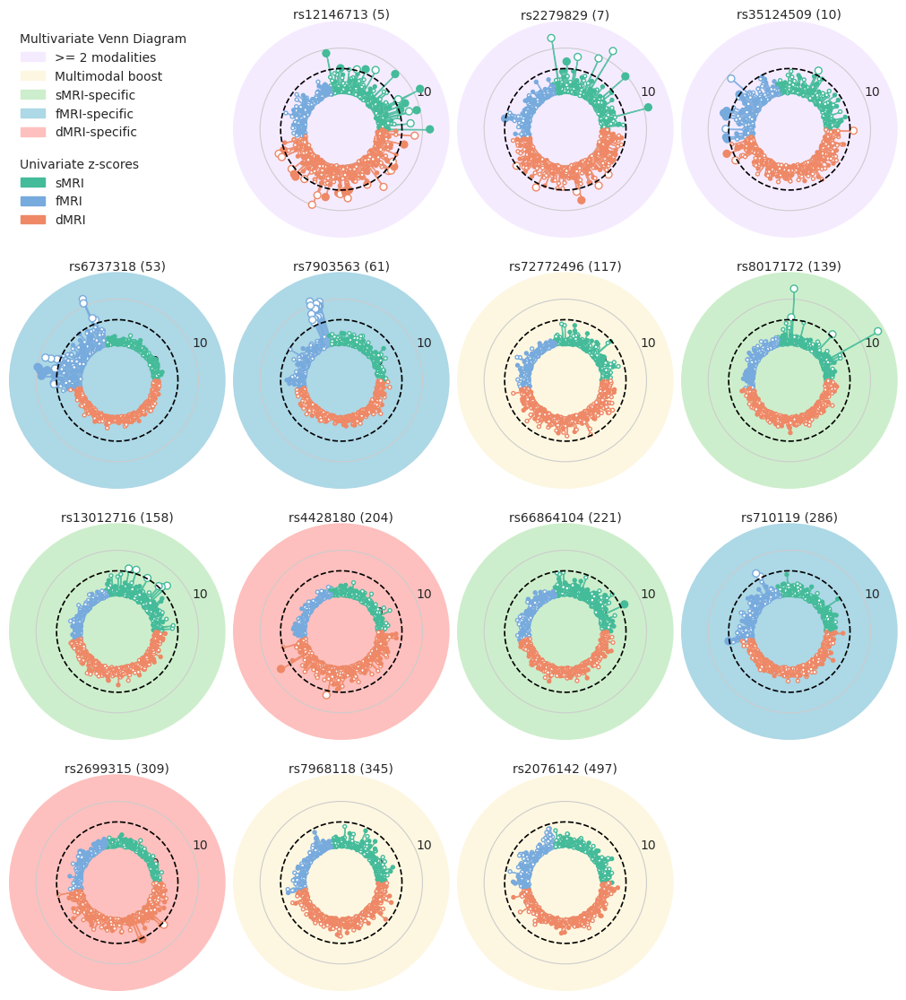

{'>= 2 modalities': 3, 'Multimodal boost': 3, 'sMRI-specific': 3, 'fMRI-specific': 3, 'dMRI-specific': 5}


In [34]:
sns.set_style('white')
savefig = True

selected_snps = "rs72772496 rs7968118 rs2076142 rs35124509 rs12146713 rs2279829 rs6737318 rs7903563 rs710119 rs13012716 rs8017172 rs66864104 rs2699315 rs4428180".split()

ncols = 4
n_snps_per_modality = 3
n_modalities = 4
nrows = (n_snps_per_modality*n_modalities + 1)//ncols + 1 + (-1 if (n_snps_per_modality*n_modalities+1)==ncols else 0)
formats = ["png", "svg"]
outf = f"/tsd/p33/home/p33-alexeas/circular_manhattan.multimodal.selected_snps.250723.light"

fig, axs = plt.subplots(nrows, ncols, figsize=(10,2.8*nrows), subplot_kw={'projection':"polar"},
                        constrained_layout=True) # constrained_layout=True
#'#4477AA', '#EE6677', '#228833', '#CCBB44', '#66CCEE', '#AA3377', '#BBBBBB'.
cluster_names = ["sMRI", "fMRI", "dMRI"]
cluster_sizes = [n_t1, n_rsfmri, n_diffusion]
# Colours: '#BBCCEE', '#CCEEFF', '#CCDDAA', '#EEEEBB', '#FFCCCC', '#DDDDDD'.
#cluster_colors = ['#228833', '#4477AA', '#EE6677'] # brignt
#cluster_colors = ['#CCDDAA', '#BBCCEE', '#FFCCCC'] # pale
cluster_colors = ['#44BB99', '#77AADD', '#EE8866'] # light
#cluster_colors = ['#555555', '#BBBBBB', '#DDDDDD'] # grey1
#cluster_colors = ['#9EA4AA', '#72787F', '#454C53'] # grey2
modality_label = [">= 2 modalities", "Multimodal boost", "sMRI-specific", "fMRI-specific", "dMRI-specific"]
modality_count = dict.fromkeys(modality_label, 0)
for label in ["dMRI-specific"]:
    modality_count[label] = 3 # n_snps_per_modality # change this accordingly!!!
#assert n_modalities == len(modality_label)
modality_facecolor = ["#f5ebff", "#fdf7e1", "#cdeecc", "#add8e6", "#fdc0be"]

modality_snps = [crossmodality_snps, multimodal_snps, t1_snps, rsfmri_snps, diffusion_snps]

colors = []
for n, c in zip(cluster_sizes, cluster_colors):
    colors += [c]*n
colors = np.array(colors)

offset = 8
normal_size = 8
gws_size = 4*normal_size
z_mat = data_lead
log10pval = np.abs(z_mat) # -np.log10(ss.norm.cdf(-np.abs(z_mat)))
theta, theta_step = np.linspace(0, 2*np.pi, log10pval.shape[1], retstep=True, endpoint=False)

i_axis, i_snp = 1, 0
for i_snp in range(lead.shape[0]):
    i = i_axis//ncols
    j = i_axis%ncols
    ax = axs[i][j]
    if i > 0 or j > 0: # True
        rs = lead.LEAD_SNP.values[i_snp]
        rs_chr, rs_bp = lead.CHR.values[i_snp], lead.LEAD_BP.values[i_snp]
        if not rs in selected_snps:
            continue
        #if (modality_count[label] > n_snps_per_modality) or not_found:
        #    i_snp += 1
        #    continue
        else:
            for label, face_color, mod_snps in zip(modality_label, modality_facecolor, modality_snps):
                if ((mod_snps.CHR==rs_chr) & (mod_snps.MinBP<=rs_bp) & (mod_snps.MaxBP>=rs_bp)).any() and ((not selected_snps) or (rs in selected_snps)):
                    modality_count[label] += 1
                    not_found = False
                    break
            i_axis += 1
            ax.set_facecolor(face_color)
            r = log10pval[i_snp]
            i_positive = z_mat[i_snp] > 0
            for i_cluster, cluster_size in enumerate(cluster_sizes):
                start_i = sum(cluster_sizes[:i_cluster])
                end_i = start_i + cluster_size
                x = theta[start_i:end_i]
                x = [x[0] - theta_step/2] + list(x) + [x[-1] + theta_step/2]
                y = [offset] + list(r[start_i:end_i] + offset) + [offset]
                # Add shading
                ax.fill_between(x, y, offset, alpha=0.8, color=cluster_colors[i_cluster])
            # Add connecting lines
            sig_threshold = -ss.norm.ppf(0.5*5E-8) # -np.log10(5E-8)
            _ = ax.plot(np.linspace(0, 2 * np.pi, 360), [sig_threshold + offset]*360, color="k", ls="--", lw=1.2)
            size = np.array([normal_size if rr < sig_threshold else gws_size for rr in r])
            # Genome-wide p-values have black outline and larger size
            #edgecolors = [c if s == normal_size else 'k' for c, s in zip(colors,size)]
            colors_direction = [c if i_positive[k] else 'w' for k,c in enumerate(colors)]
            colors_no_direction = [c for k,c in enumerate(colors)]
            edgecolors = np.array([c for c, s in zip(colors,size)])
            c = ax.scatter(theta, r + offset, c=colors_direction, s=size, marker='o', edgecolors=edgecolors)
            ax.text(0.5, 1.03, f"{rs} ({i_snp+1})", ha='center', va='center', transform = ax.transAxes, size=10)
            i_snp += 1

            y = np.arange(0,30,10)
            ax.set_yticks(y + offset)
            ax.set_yticklabels(list(map(str,y)))
            ax.set_ylim((0,24))
            ax.spines['polar'].set_visible(False)
            ax.grid(False, axis='x')
            ax.tick_params(labelleft=True, labelright=False, labeltop=False, labelbottom=False, labelsize=10)

for ia in range(i_axis, nrows*ncols):
    i = ia//ncols
    j = ia%ncols
    axs[i][j].axis("off")
            
legends1_handles = []
for name, color, size in zip(cluster_names, cluster_colors, cluster_sizes):
    patch = Patch(color=color, label=name)
    legends1_handles.append(patch)

legends2_handles = []
for color, name in zip(modality_facecolor, modality_label):
    patch = Patch(color=color, label=name)
    legends2_handles.append(patch)

            
# add legend to the first axis
if True:
    ax = axs[0][0]
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['polar'].set_visible(False)
    legend1 = ax.legend(loc='lower left', handles=legends1_handles, fontsize=10, frameon=False,
             title="Univariate z-scores", title_fontsize=10, alignment='left')
    
    ax.legend(loc='upper left', handles=legends2_handles, fontsize=10, frameon=False,
             title="Multivariate Venn Diagram", title_fontsize=10, alignment='left')
    ax.add_artist(legend1)
else: # add figure legend
    fig.legend(loc='upper center', handles=legends_handles, fontsize=12, frameon=False,
                  title="Phenotype clusters",title_fontsize=12, ncol=5, bbox_to_anchor=(0.5, 1.03)) # bbox_to_anchor=(0.5, -0.10)
            
#plt.tight_layout()
if savefig:
    for ext in formats:
        plt.savefig(f"{outf}.{ext}", facecolor='w')
plt.show()
print(modality_count)

In [29]:
from sklearn.cluster import DBSCAN, OPTICS
import numpy as np
from collections import Counter

In [30]:
data_lead.shape

(794, 583)

In [31]:
X = data_lead
clustering = OPTICS(min_samples=5, n_jobs=8, metric='euclidean').fit(X)
print(Counter(clustering.labels_))

Counter({0: 784, -1: 10})


In [32]:
import seaborn as sns

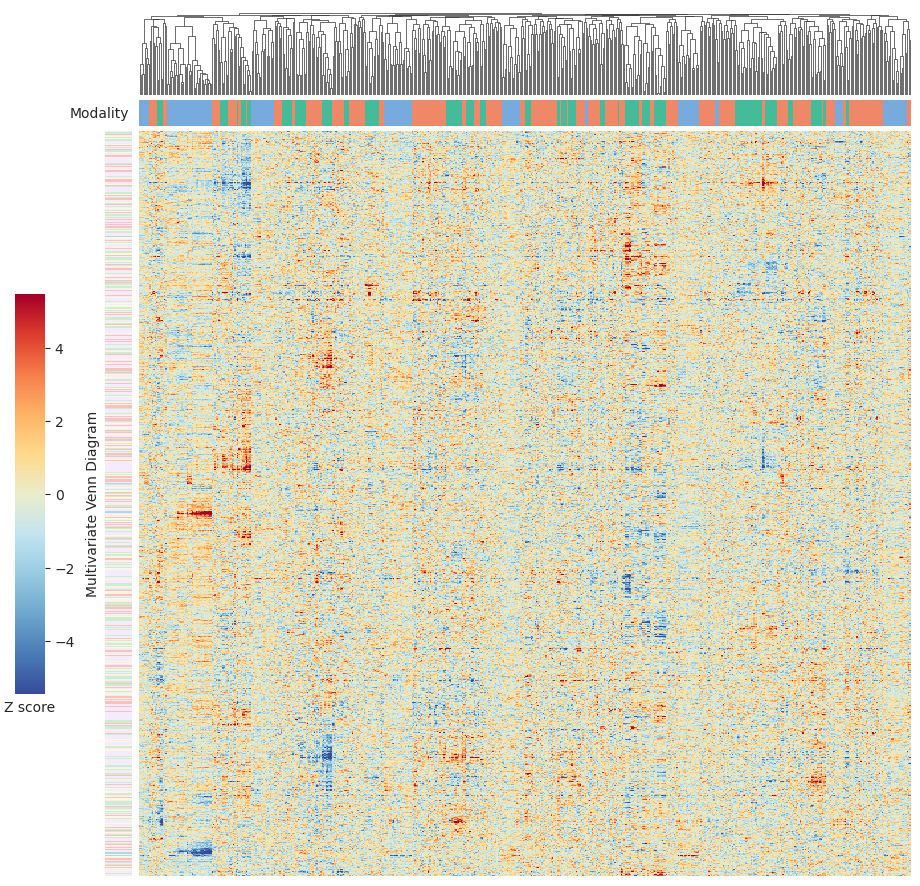

In [80]:
savefig = True
formats = ["png"]
outf = "/tsd/p33/home/p33-alexeas/clustermap.multimodal.lead_snps.290623"

sunset_colors = ['#364B9A', '#4A7BB7', '#6EA6CD', '#98CAE1', '#C2E4EF', '#EAECCC', '#FEDA8B', '#FDB366', '#F67E4B', '#DD3D2D', '#A50026']
sunset_cmap = LinearSegmentedColormap.from_list("sunset", sunset_colors)

n_t1, n_rsfmri, n_diffusion = 171, 139, 273
cluster_names = ["sMRI", "fMRI", "dMRI"]
cluster_sizes = [n_t1, n_rsfmri, n_diffusion]
cluster_colors = ['#44BB99', '#77AADD', '#EE8866'] # light
modality_label = [">= 2 modalities", "Multimodal boost", "sMRI-specific", "fMRI-specific", "dMRI-specific"]
modality_facecolor = ["#f5ebff", "#fdf7e1", "#cdeecc", "#add8e6", "#fdc0be"]

modality_snps = [crossmodality_snps, multimodal_snps, t1_snps, rsfmri_snps, diffusion_snps]

col_colors = []
for n, c in zip(cluster_sizes, cluster_colors):
    col_colors += [c]*n
col_colors = pd.Series(col_colors, name="Modality")

row_colors = []
is_found = []
for i_snp in range(lead.shape[0]):
    rs = lead.LEAD_SNP.values[i_snp]
    rs_chr, rs_bp = lead.CHR.values[i_snp], lead.LEAD_BP.values[i_snp]
    not_found = True
    for label, face_color, mod_snps in zip(modality_label, modality_facecolor, modality_snps):
        if ((mod_snps.CHR==rs_chr) & (mod_snps.MinBP<=rs_bp) & (mod_snps.MaxBP>=rs_bp)).any():
            not_found = False
            break
    if not not_found:
        row_colors.append(face_color)
        is_found.append(True)
    else:
        row_colors.append("#BBBBBB")
        is_found.append(False)
row_colors = pd.Series(row_colors, name="SNP category")
row_colors = row_colors[is_found].reset_index(drop=True)
X = data_lead[is_found]
ax_grid = sns.clustermap(pd.DataFrame(X), cmap=sunset_cmap, center=0, vmin=-5.45, vmax=5.45, col_cluster=True, metric='correlation',
              col_colors=col_colors, row_colors=row_colors, dendrogram_ratio=0.1, cbar_pos=(.02, .3, .03, .4))
ax_grid.ax_heatmap.axis('off')
ax_grid.ax_row_dendrogram.clear()
ax_grid.ax_row_dendrogram.axis('off')
ax_grid.ax_col_colors.yaxis.set_ticks_position('none')
ax_grid.ax_col_colors.tick_params(labelleft=True, labelright=False, labelrotation=0) # 
ax_grid.ax_row_colors.tick_params(labeltop=False, labelbottom=False) # 
ax_grid.ax_row_colors.set_ylabel("Multivariate Venn Diagram")
ax_grid.ax_cbar.set_xlabel("Z score")

if savefig:
    for ext in formats:
        plt.savefig(f"{outf}.{ext}", facecolor='w')